<a href="https://colab.research.google.com/github/KhadijaMahanga/notebooks-sturdy/blob/main/Air_Quality_Health_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Explaratory Data Analysis on Air Pollutant data and Health Data

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
## Mount your Google Drive to Collaboratory
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
df_NO2 = pd.read_csv('/content/drive/MyDrive/Data Science Big Data Research/Assignments/Group 4 Activities/IS 670 EDA/NO2_exposure_SGA.csv')
df_O3 = pd.read_csv('/content/drive/MyDrive/Data Science Big Data Research/Assignments/Group 4 Activities/IS 670 EDA/Ozone_exposure_SGA.csv')
df_PM25 = pd.read_csv('/content/drive/MyDrive/Data Science Big Data Research/Assignments/Group 4 Activities/IS 670 EDA/PM2.5_exposure_SGA.csv')
df_health = pd.read_csv('/content/drive/MyDrive/Data Science Big Data Research/Assignments/Group 4 Activities/IS 670 EDA/death_respiratory_diseases_data_IHME-GBD_2021.csv')

## Air Pollutant Data Cleaning

In [4]:
df_air = pd.concat([df_NO2, df_O3, df_PM25], ignore_index = True)
df_air = df_air.map(lambda x: str(x).lstrip('=').strip('"'))
df_air.columns = df_air.columns.map(lambda x: str(x).lstrip('=').strip('"'))
df_air.tail()

,Exposure Id,Type,Country,ISO3,Region,Name,Exposure Lower,Exposure Mean,Exposure Upper,Year,Pollutant,Pollutant Name,Region Name,Units
1396,117689.0,country,United States of America,USA,country,United States of America,7.71,7.82,7.92,2018,pm25,PM<sub>2.5</sub>,Country,µg/m3
1397,117690.0,country,United States of America,USA,country,United States of America,7.08,7.18,7.28,2019,pm25,PM<sub>2.5</sub>,Country,µg/m3
1398,117691.0,country,United States of America,USA,country,United States of America,7.55,7.81,8.11,2020,pm25,PM<sub>2.5</sub>,Country,µg/m3
1399,nan,,,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
1400,nan,citation,Health Effects Institute. 2024. State of Globa...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


### Checking for nulls and duplicate

In [5]:
# check for missing values:
df_air = df_air.replace('nan', np.nan)
df_air.isnull().sum()

,0
Exposure Id,6
Type,0
Country,0
ISO3,6
Region,6
Name,6
Exposure Lower,6
Exposure Mean,6
Exposure Upper,6
Year,6


In [6]:
df_air.shape

(1401, 14)

In [7]:
df_air = df_air.dropna()

In [8]:
# check for duplicates
df_air[df_air.duplicated()]

,Exposure Id,Type,Country,ISO3,Region,Name,Exposure Lower,Exposure Mean,Exposure Upper,Year,Pollutant,Pollutant Name,Region Name,Units


In [9]:
# remove unnecessary fields
df_air.drop(["Exposure Id", "Type", "Region", "Name", "Region Name", "Pollutant Name"],axis=1,inplace=True)

In [10]:
df_air.sample(10)

,Country,ISO3,Exposure Lower,Exposure Mean,Exposure Upper,Year,Pollutant,Units
1218,Morocco,MAR,17.7,21.8,26.6,1995,pm25,µg/m3
1129,Democratic Republic of the Congo,COD,17,25.8,37.2,1999,pm25,µg/m3
706,France,FRA,43.1,43.4,43.8,2012,ozone,ppb
1348,United Republic of Tanzania,TZA,15.8,20.5,26.7,2001,pm25,µg/m3
132,Canada,CAN,10.8,33.9,25.5,1998,no2,µg/m3
855,Sweden,SWE,38.7,39.5,40.2,2006,ozone,ppb
1048,Burundi,BDI,14.8,30.5,54,2011,pm25,µg/m3
1203,Ghana,GHA,34.3,52.8,79.4,2011,pm25,µg/m3
981,Argentina,ARG,12.7,15.6,19.4,2006,pm25,µg/m3
1009,Brazil,BRA,11.2,15.5,21,2003,pm25,µg/m3


In [11]:
#make sure we have the right objects
df_air['Year'] = df_air['Year'].astype('int64')
df_air['Exposure Mean'] = df_air['Exposure Mean'].astype('float')
df_air.dtypes

,0
Country,object
ISO3,object
Exposure Lower,object
Exposure Mean,float64
Exposure Upper,object
Year,int64
Pollutant,object
Units,object


## Health Data Cleaning

In [12]:
df_health = pd.read_csv('/content/drive/MyDrive/Data Science Big Data Research/Assignments/Group 4 Activities/IS 670 EDA/respiratory_diseases_data_IHME-GBD_2021.csv')
df_health.head()

,measure_id,measure_name,location_id,location_name,sex_id,sex_name,age_id,age_name,cause_id,cause_name,metric_id,metric_name,year,val,upper,lower
0,1,Deaths,80,France,3,Both,22,All ages,956,Respiratory infections and tuberculosis,3,Rate,1990,35.807287,38.112525,32.213310
1,1,Deaths,97,Argentina,3,Both,22,All ages,516,Interstitial lung disease and pulmonary sarcoi...,3,Rate,1990,2.206784,2.416444,2.002124
2,1,Deaths,97,Argentina,3,Both,22,All ages,520,Other chronic respiratory diseases,3,Rate,1990,1.272220,1.473304,1.128184
3,1,Deaths,196,South Africa,3,Both,22,All ages,322,Lower respiratory infections,3,Rate,1990,75.376404,83.877561,68.246720
4,1,Deaths,196,South Africa,3,Both,22,All ages,328,Upper respiratory infections,3,Rate,1990,0.578072,1.194730,0.292097


In [13]:
# check for missing values:
df_health = df_health.replace('nan', np.nan)
df_health.isnull().sum()

,0
measure_id,0
measure_name,0
location_id,0
location_name,0
sex_id,0
sex_name,0
age_id,0
age_name,0
cause_id,0
cause_name,0


In [14]:
# check for duplicates
df_health[df_health.duplicated]

,measure_id,measure_name,location_id,location_name,sex_id,sex_name,age_id,age_name,cause_id,cause_name,metric_id,metric_name,year,val,upper,lower


In [15]:
# remove unnecessary columns
df_health.drop(['measure_id', 'location_id', 'sex_id', 'sex_name', 'age_id', 'age_name', 'cause_id', 'metric_id' ], axis=1,inplace=True)

In [16]:
df_health.dtypes

,0
measure_name,object
location_name,object
cause_name,object
metric_name,object
year,int64
val,float64
upper,float64
lower,float64


In [17]:
df_health.sample(13)

,measure_name,location_name,cause_name,metric_name,year,val,upper,lower
4163,Deaths,Canada,Tuberculosis,Rate,1993,0.755675,0.804109,0.698139
1659,Deaths,France,Asthma,Rate,2001,2.704345,2.901996,2.457967
3312,Deaths,United Republic of Tanzania,Pneumoconiosis,Rate,2011,0.086832,0.145390,0.042009
919,Deaths,Morocco,Asthma,Rate,2001,8.407620,11.818587,6.233356
371,Deaths,Burundi,Upper respiratory infections,Rate,1990,3.058385,9.024690,0.183564
3685,Deaths,Democratic Republic of the Congo,Chronic respiratory diseases,Rate,2017,22.048063,39.807633,14.245216
273,Deaths,United States of America,Lower respiratory infections,Rate,1994,28.472582,30.235031,25.111370
2234,Deaths,France,Lower respiratory infections,Rate,2005,28.815228,31.092209,24.954165
490,Deaths,United States of America,Lower respiratory infections,Rate,1997,29.159041,31.039136,25.595713
3332,Deaths,Sweden,Lower respiratory infections,Rate,2014,24.289800,26.658583,20.491932


## Air Pollutant Data Exploration

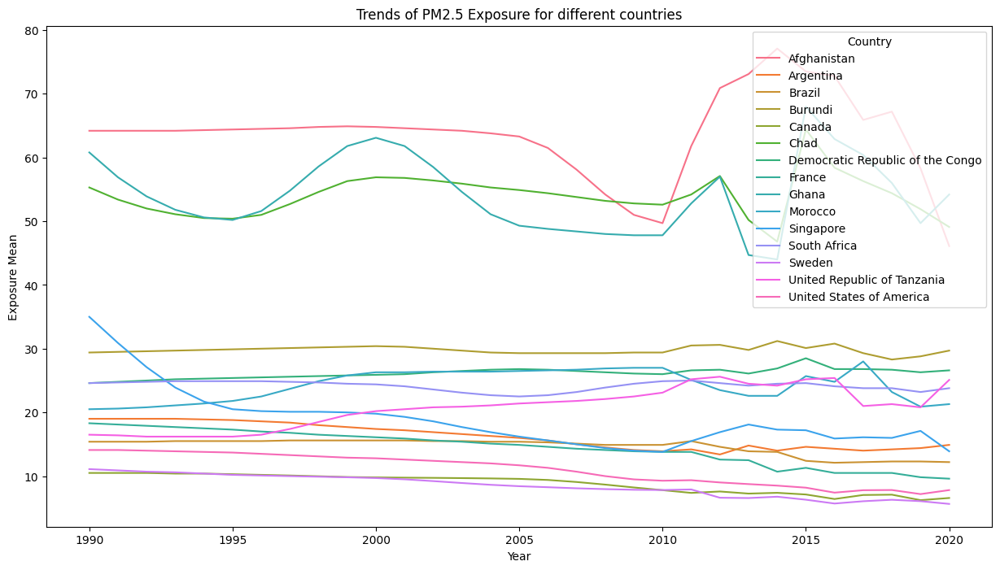

In [18]:
plt.figure(figsize=(15, 8))
sns.lineplot(
    data=df_air[(df_air.Pollutant == 'pm25')],
    x="Year", y="Exposure Mean", hue="Country"
)
plt.title('Trends of PM2.5 Exposure for different countries')
plt.show()

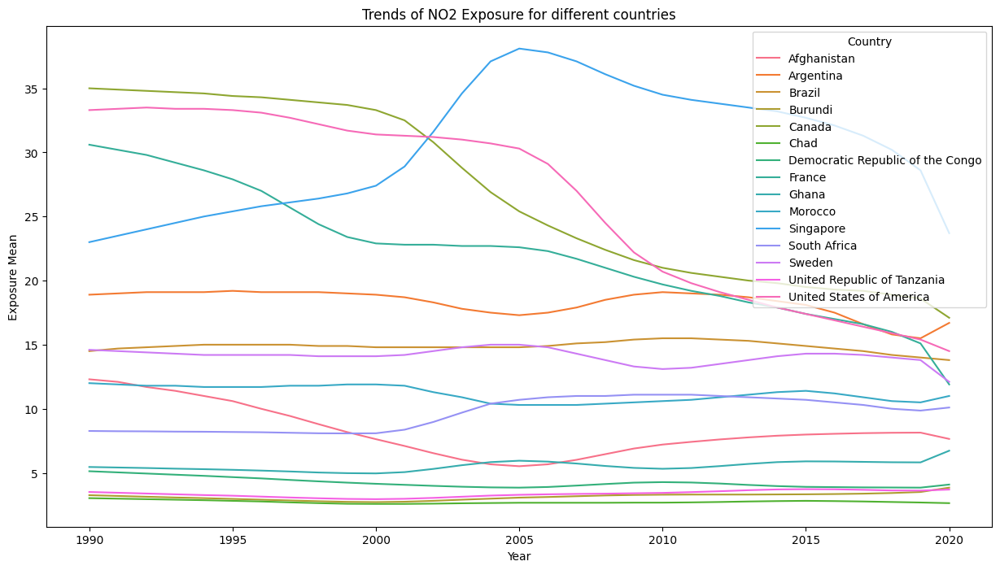

In [19]:
plt.figure(figsize=(15, 8))
sns.lineplot(
    data=df_air[(df_air.Pollutant == 'no2')],
    x="Year", y="Exposure Mean", hue="Country"
)
plt.title('Trends of NO2 Exposure for different countries')
plt.show()

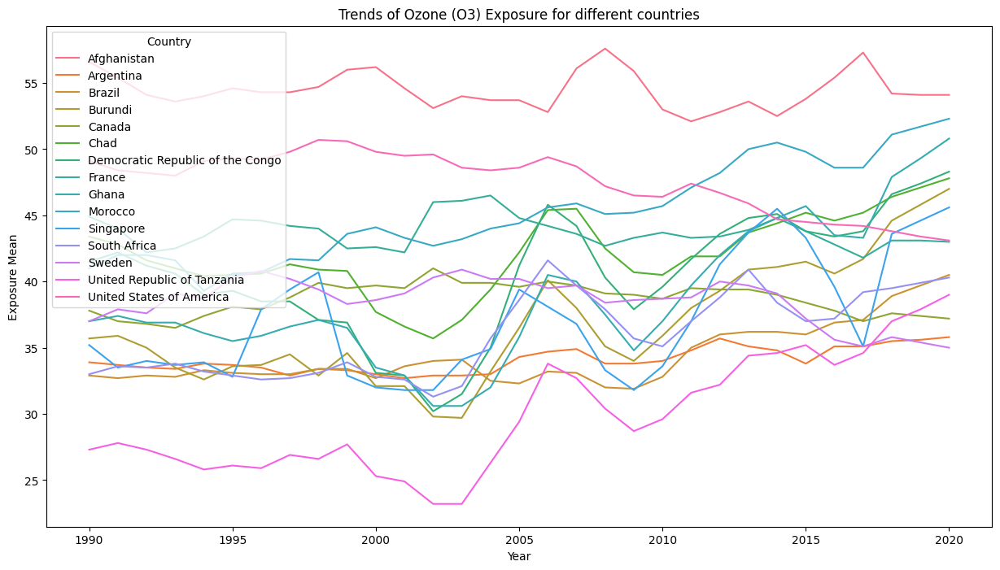

In [20]:
plt.figure(figsize=(15, 8))
sns.lineplot(
    data=df_air[(df_air.Pollutant == 'ozone')],
    x="Year", y="Exposure Mean", hue="Country"
)
plt.title('Trends of Ozone (O3) Exposure for different countries')
plt.show()

In [21]:
custom_palette = ['#C0C78C', '#B99470', '#FEFAE0', '#A6B37D']

#Set the custom palette in seaborn
sns.set_palette(custom_palette)


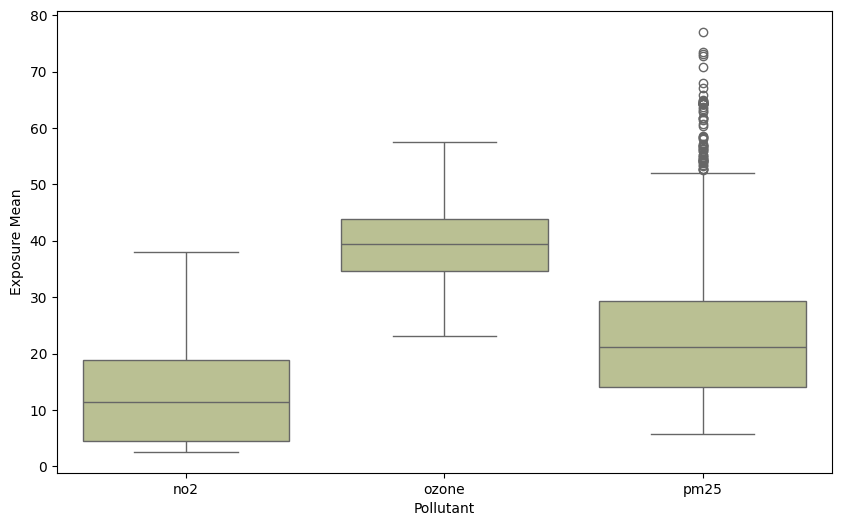

In [22]:
# box plot by pollutant
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_air, x="Pollutant", y="Exposure Mean")
plt.show()

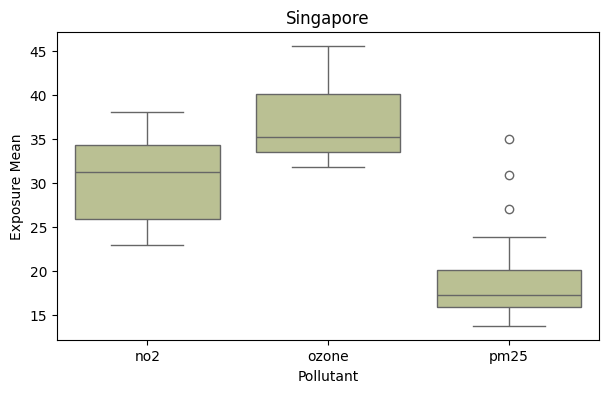

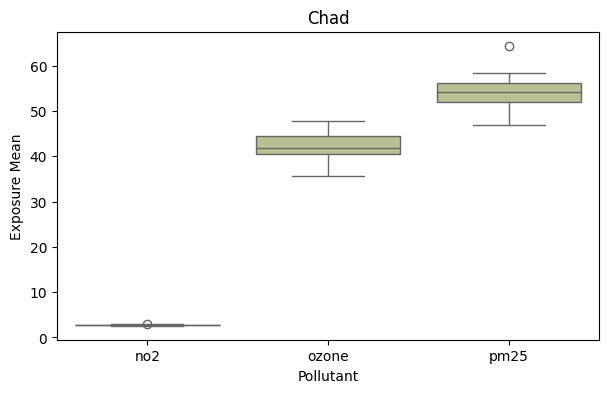

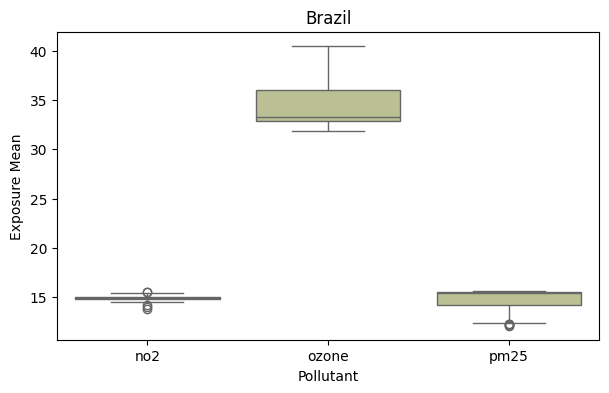

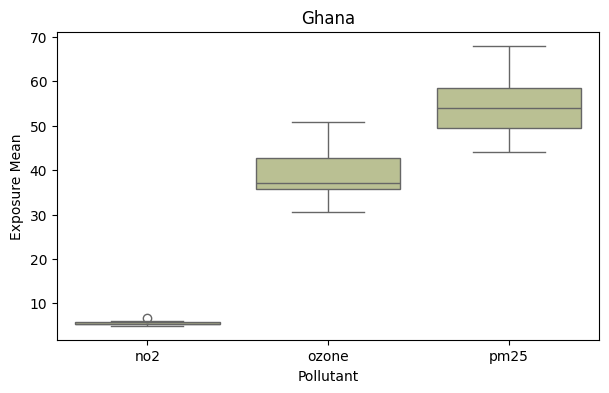

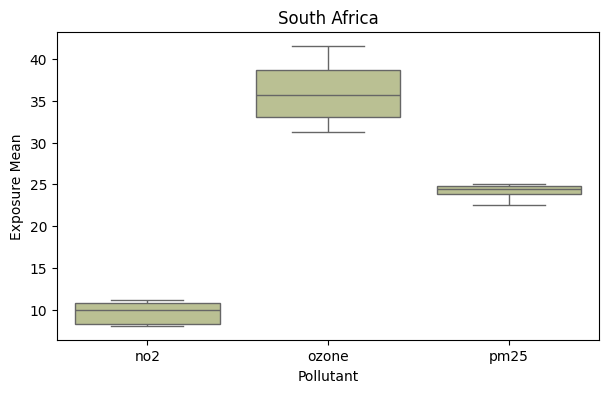

In [23]:
# select few countries and draw box plot for each pollutants to understand the distribution of value for each pollutant
countries = ["Singapore", "Chad", "Brazil", "Ghana", "South Africa"]
for c in countries:
  plt.figure(figsize=(7, 4))
  sns.boxplot(data=df_air[df_air.Country == c], x="Pollutant", y="Exposure Mean")
  plt.title(c)
  plt.show()


## Health Data Exploration

In [32]:
# for each disease draw a graph to check the rate of death per 100,000 for each country
disease_counts = df_health['cause_name'].value_counts()
disease_counts.index

'Respiratory infections and tuberculosis'

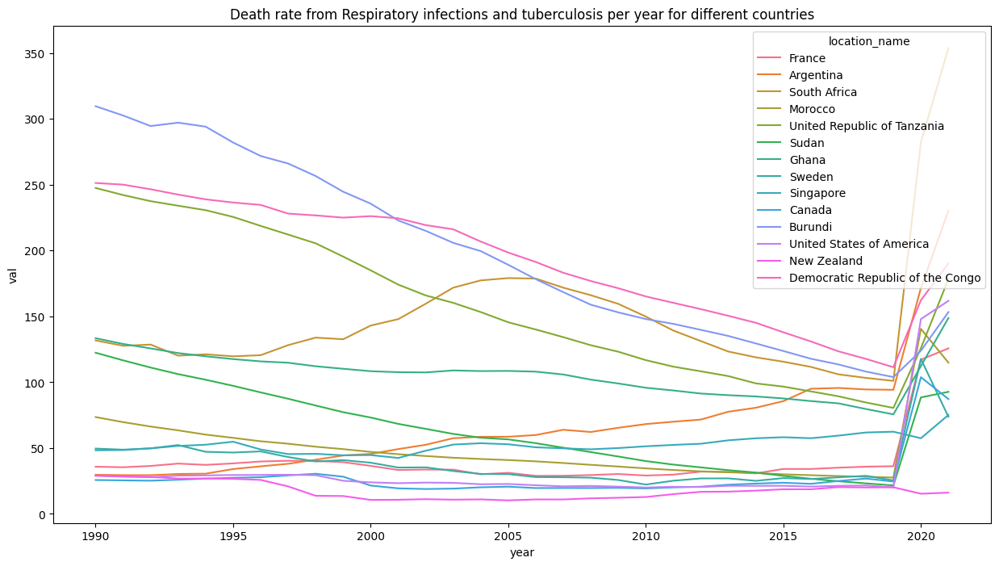

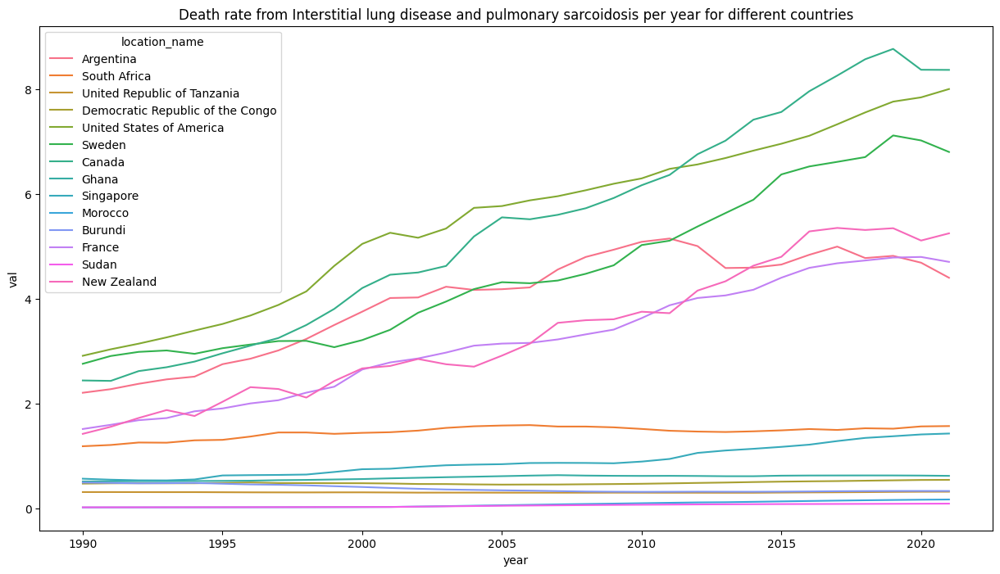

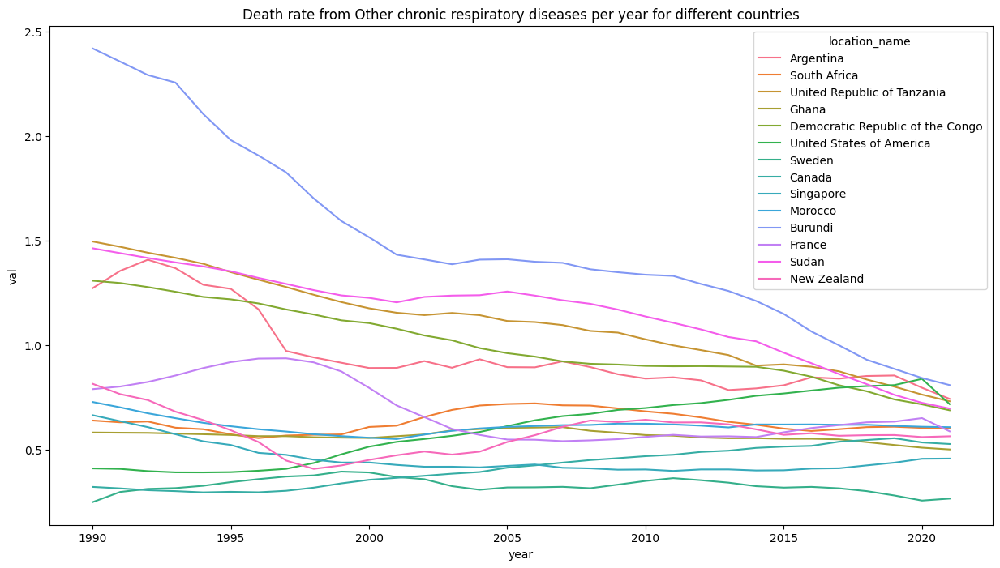

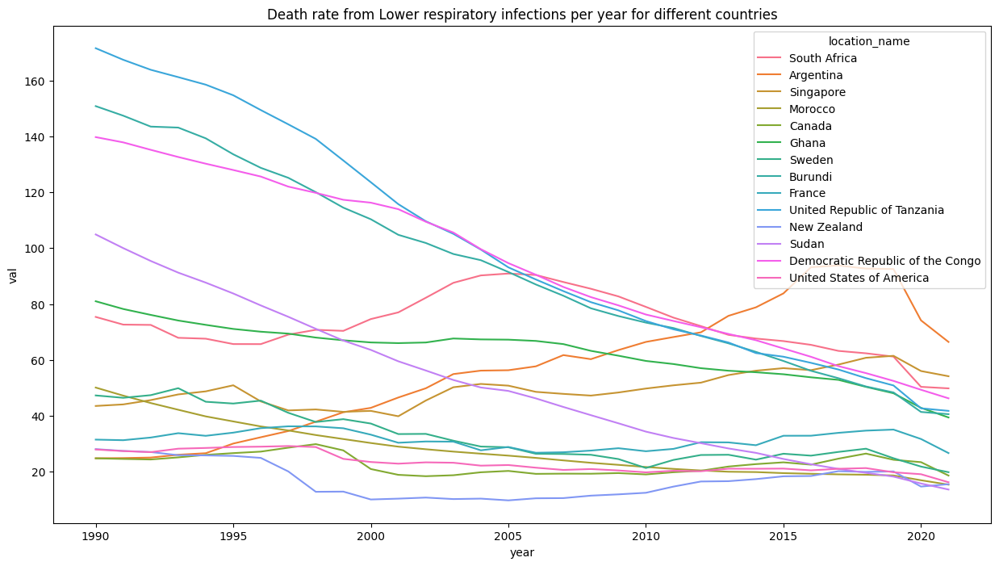

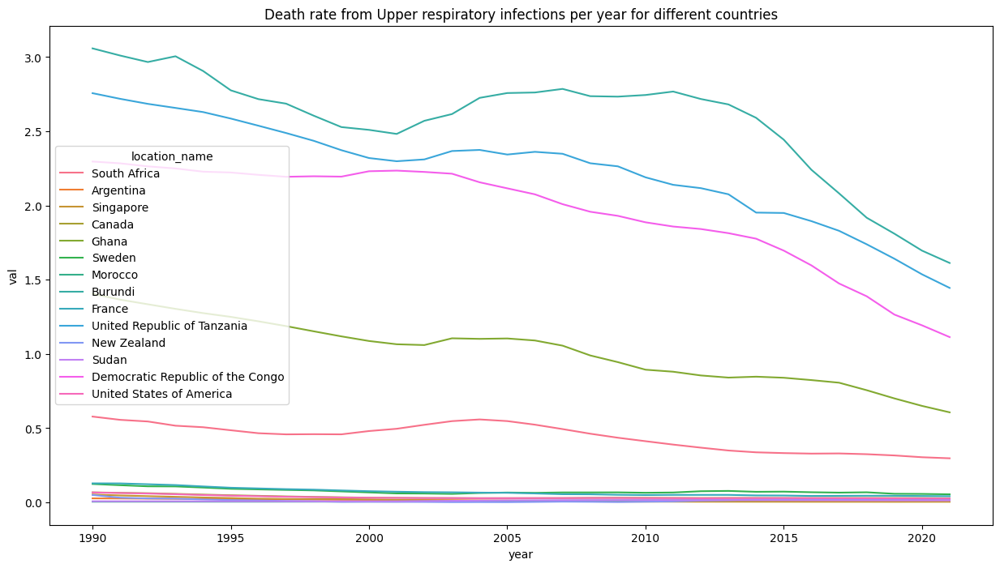

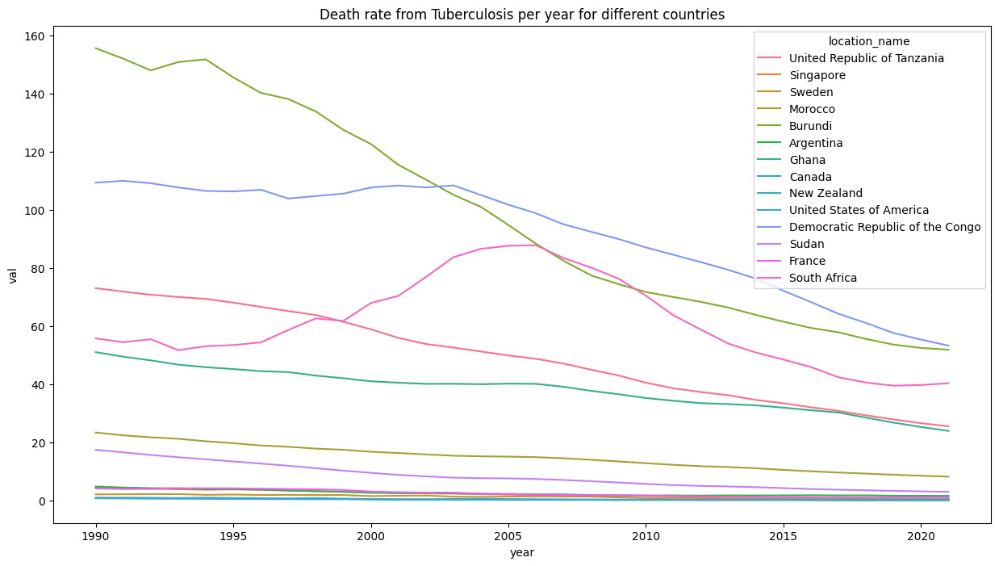

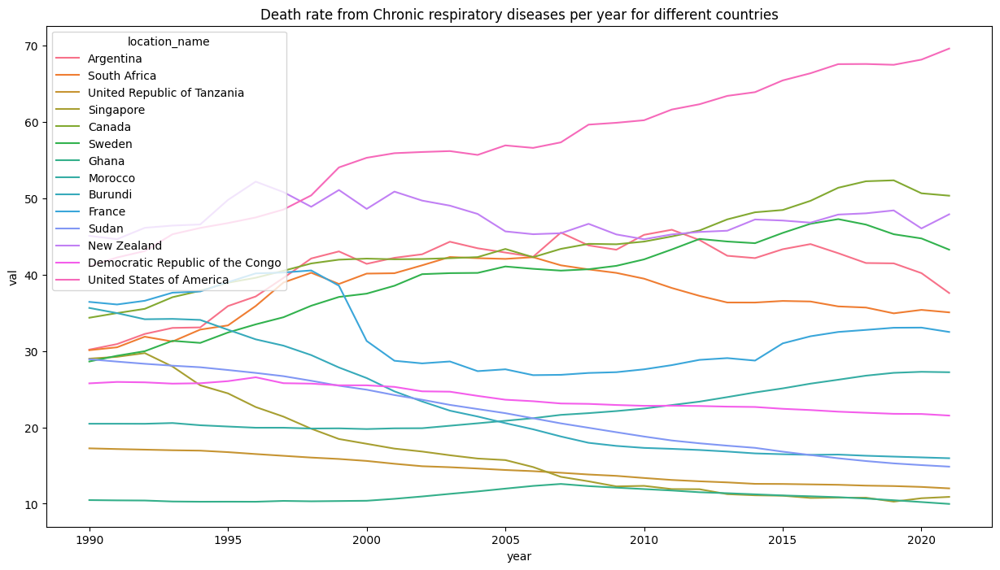

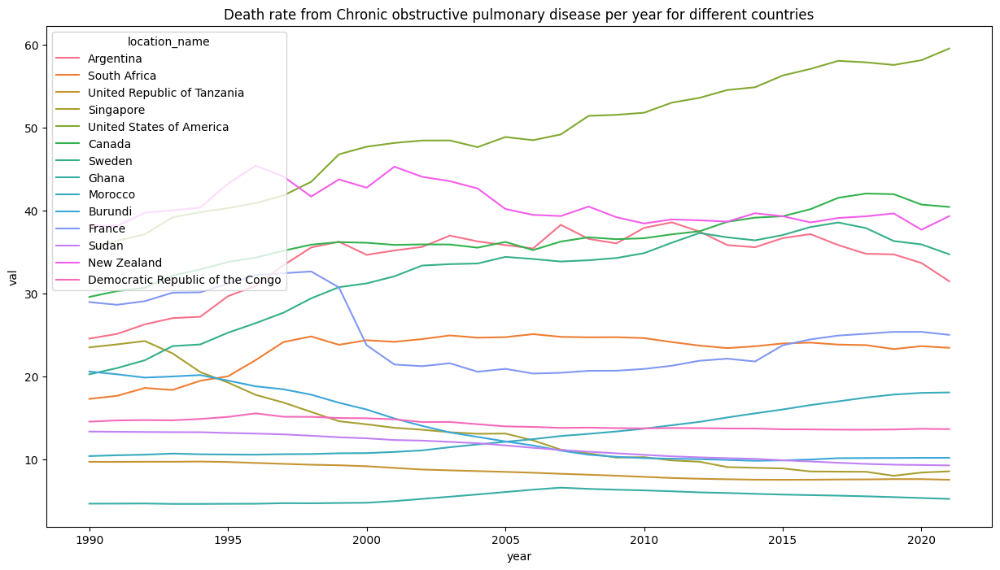

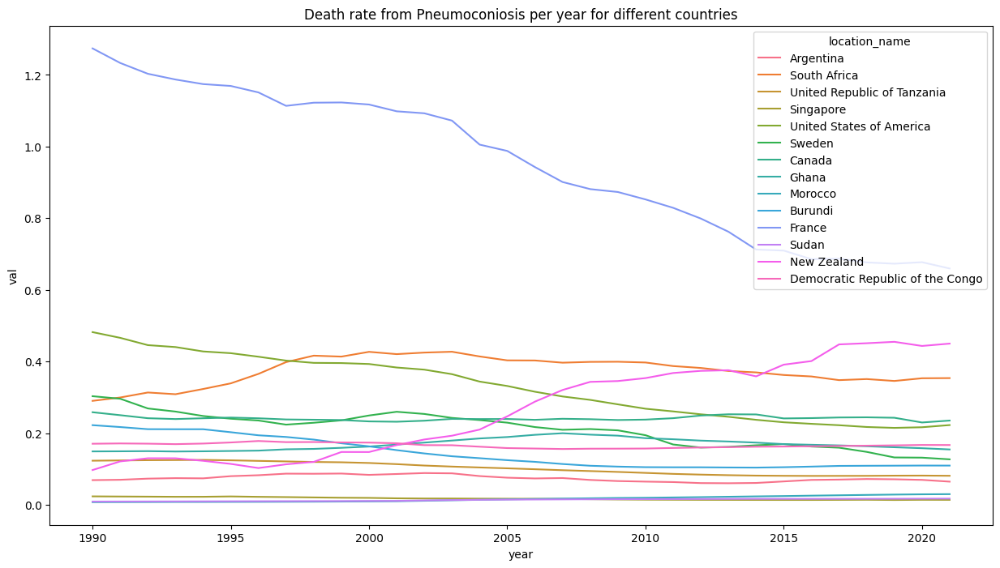

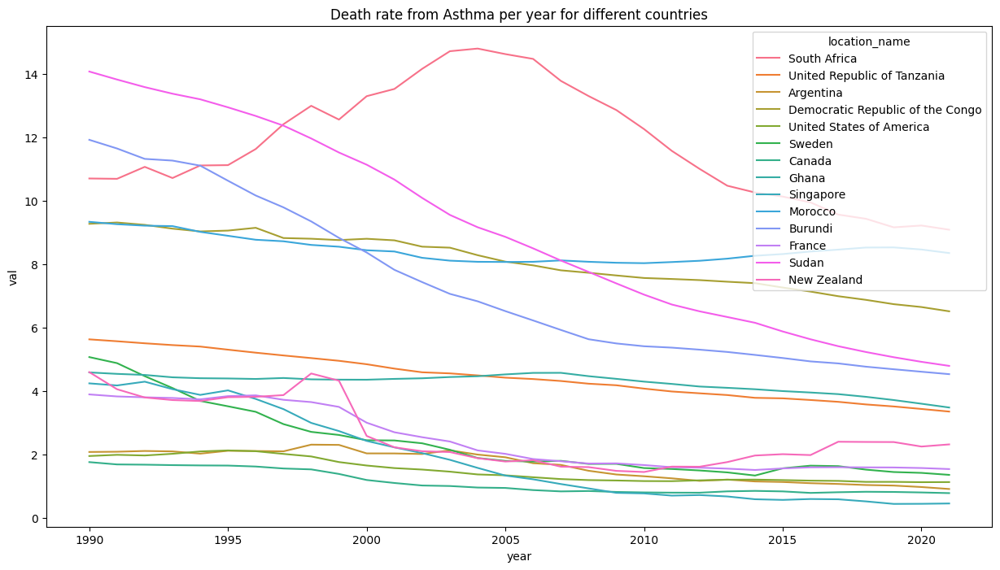

In [33]:
for d in disease_counts.index:
  plt.figure(figsize=(15, 8))
  sns.lineplot(
      data=df_health[(df_health.cause_name == d)],
      x="year", y="val", hue="location_name"
  )
  plt.title(f'Death rate from {d} per year for different countries')
  plt.show()

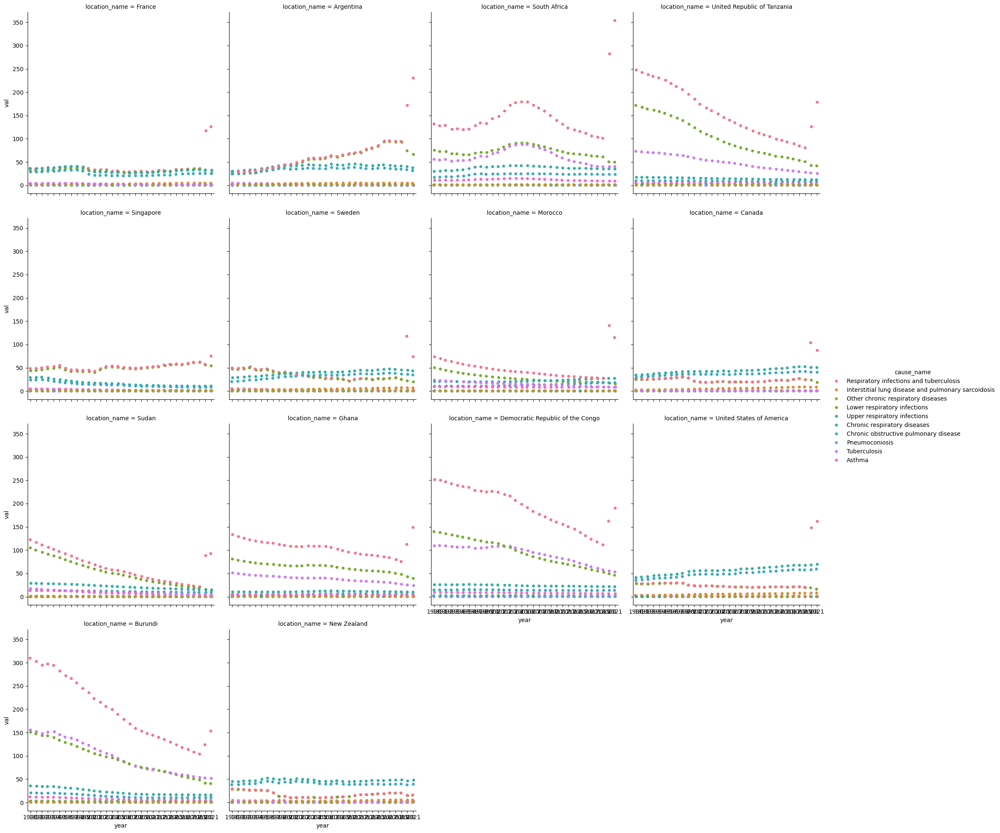

In [45]:
# for each country lets view all diseases per year
location_counts = df_health['location_name'].value_counts()

# Initialise the subplot function using number of rows and columns
# figure, axis = plt.subplots(33, 3)

# for i, d in enumerate(disease_counts.index):
#   for j, l in enumerate(location_counts.index):
#     plt.figure(figsize=(5, 3))
#     sns.barplot(
#         data=df_health[(df_health.location_name == l) & (df_health.cause_name == d)],
#         x="year", y="val", ax=axis[i * j]
#     )
#     plt.title(f'Death rate from {d} per year for {l}')
#     plt.show()

sns.catplot(data=df_health, x='year', y='val', hue='cause_name', col='location_name', col_wrap=4)

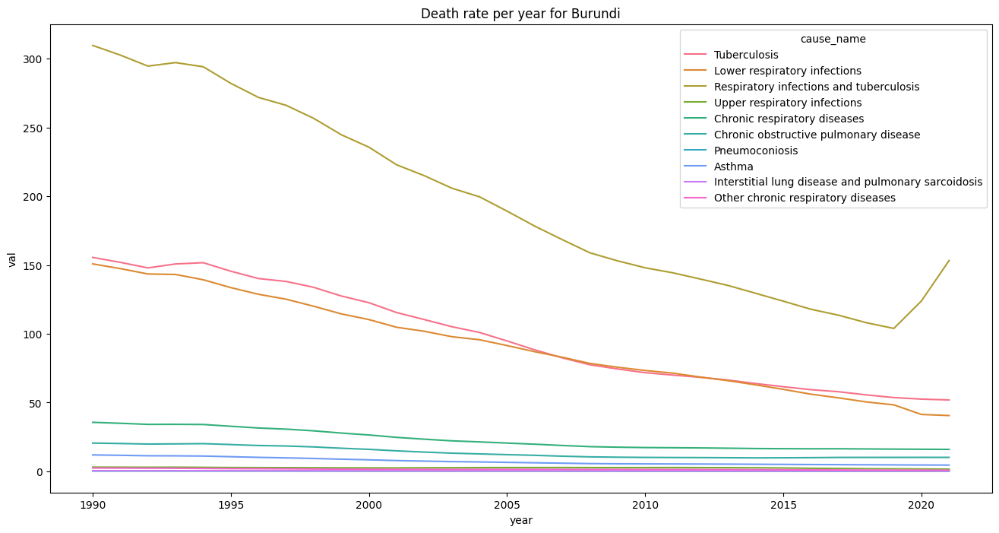

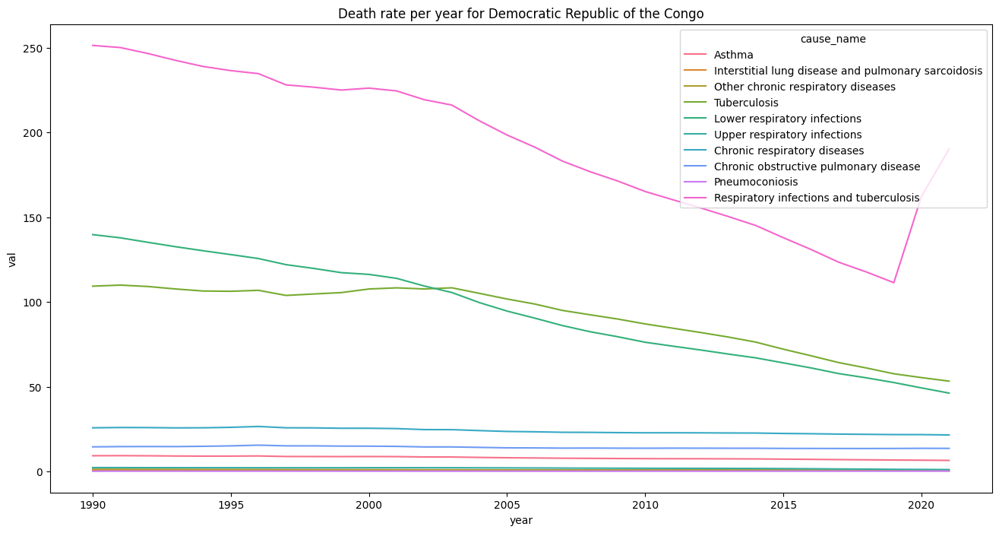

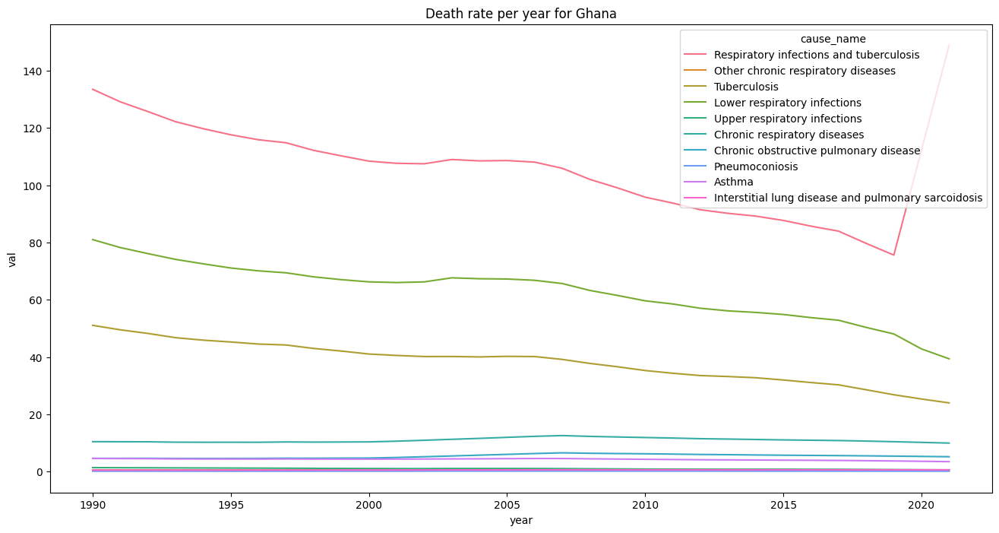

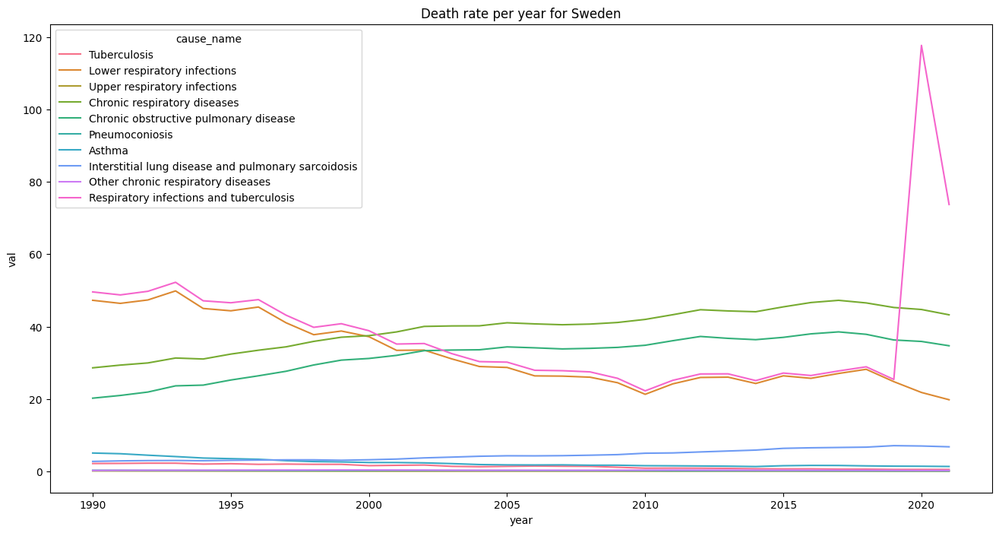

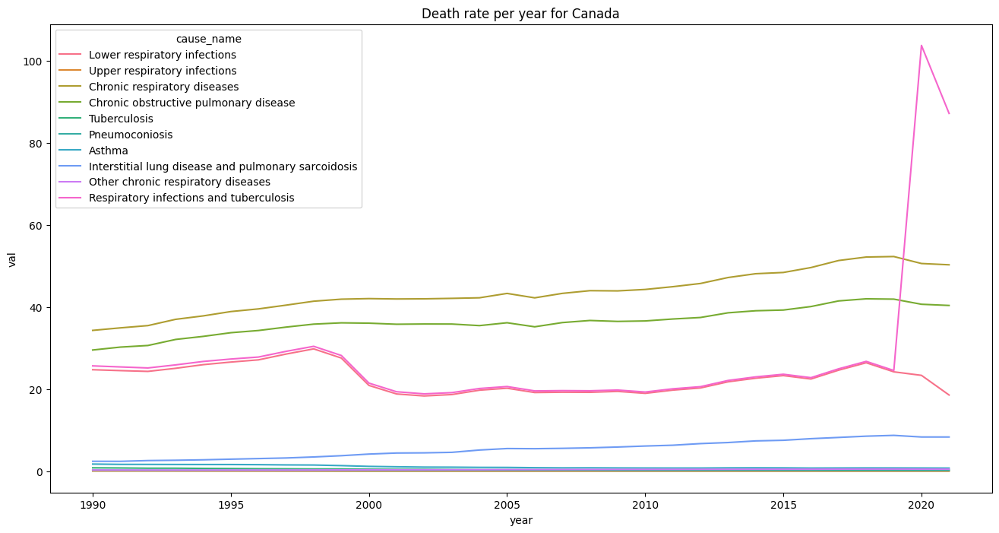

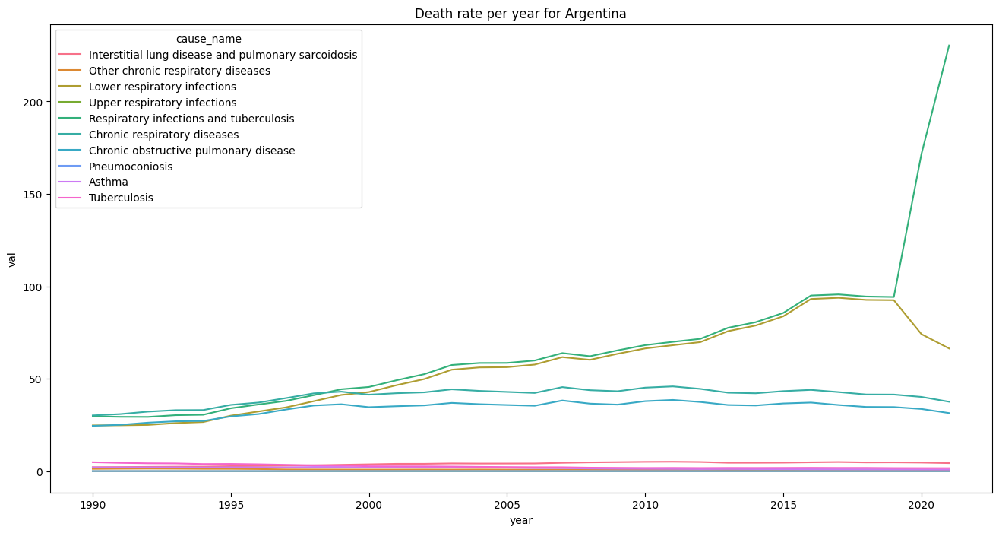

In [52]:
# select 5 countries and observe disease death rate with trends of air pollutant
selected_countries = ['Burundi', 'Democratic Republic of the Congo', 'Ghana', 'Sweden', 'Canada', 'Argentina']

for c in selected_countries:
    plt.figure(figsize=(16, 8))
    sns.lineplot(
        data=df_health[(df_health.location_name == c)],
        x="year", y="val", hue="cause_name"
    )
    plt.title(f'Death rate per year for {c}')
    plt.show()


## Correlation between Air Pollutant and Health Data

In [53]:
#update columns name of health to match air pollutant
df_health.rename(columns={'location_name': 'country'}, inplace=True)
df_air.rename(columns={'Country': 'country', 'Year': 'year'}, inplace=True)


In [54]:
df_health.head()

,measure_name,country,cause_name,metric_name,year,val,upper,lower
0,Deaths,France,Respiratory infections and tuberculosis,Rate,1990,35.807287,38.112525,32.213310
1,Deaths,Argentina,Interstitial lung disease and pulmonary sarcoi...,Rate,1990,2.206784,2.416444,2.002124
2,Deaths,Argentina,Other chronic respiratory diseases,Rate,1990,1.272220,1.473304,1.128184
3,Deaths,South Africa,Lower respiratory infections,Rate,1990,75.376404,83.877561,68.246720
4,Deaths,South Africa,Upper respiratory infections,Rate,1990,0.578072,1.194730,0.292097


In [62]:


# Merge datasets on country and year
countries_of_interest = ['Burundi', 'Democratic Republic of the Congo', 'Ghana', 'Sweden', 'Canada', 'Argentina', 'United States of America', 'United Republic of Tanzania']
death_data = df_health[df_health.country.isin(countries_of_interest)]
pollution_data = df_air[df_air.country.isin(countries_of_interest)]

merged_data = pd.merge(death_data, pollution_data, on=['country', 'year'])

# Pivot data for correlation
pivoted_data = merged_data.pivot_table(
    index=['country', 'year', 'cause_name', 'val'],
    columns='Pollutant',
    values='Exposure Mean'
).reset_index()

pivoted_data.head()

Pollutant,country,year,cause_name,val,no2,ozone,pm25
0,Argentina,1990,Asthma,2.082500,18.9,33.9,19.0
1,Argentina,1990,Chronic obstructive pulmonary disease,24.541678,18.9,33.9,19.0
2,Argentina,1990,Chronic respiratory diseases,30.172576,18.9,33.9,19.0
3,Argentina,1990,Interstitial lung disease and pulmonary sarcoi...,2.206784,18.9,33.9,19.0
4,Argentina,1990,Lower respiratory infections,24.779794,18.9,33.9,19.0


In [87]:
# Calculate correlations for each disease
correlation_results = {}
for disease, group in pivoted_data.groupby(['country', 'cause_name']):
  # Select only numeric columns for correlation
  numeric_cols = group[['val', 'no2', 'ozone', 'pm25']]
  corr = numeric_cols.corr(method='pearson')
  correlation_results[disease] = corr
  print(f"\nCorrelations for {'-'.join(disease)}:\n", corr)


Correlations for Argentina-Asthma:
 Pollutant       val       no2     ozone      pm25
Pollutant                                        
val        1.000000  0.557290 -0.825701  0.891946
no2        0.557290  1.000000 -0.576528  0.513142
ozone     -0.825701 -0.576528  1.000000 -0.681341
pm25       0.891946  0.513142 -0.681341  1.000000

Correlations for Argentina-Chronic obstructive pulmonary disease:
 Pollutant       val       no2     ozone      pm25
Pollutant                                        
val        1.000000 -0.313416  0.250448 -0.776123
no2       -0.313416  1.000000 -0.576528  0.513142
ozone      0.250448 -0.576528  1.000000 -0.681341
pm25      -0.776123  0.513142 -0.681341  1.000000

Correlations for Argentina-Chronic respiratory diseases:
 Pollutant       val       no2     ozone      pm25
Pollutant                                        
val        1.000000 -0.315207  0.240886 -0.777024
no2       -0.315207  1.000000 -0.576528  0.513142
ozone      0.240886 -0.576528  1.000

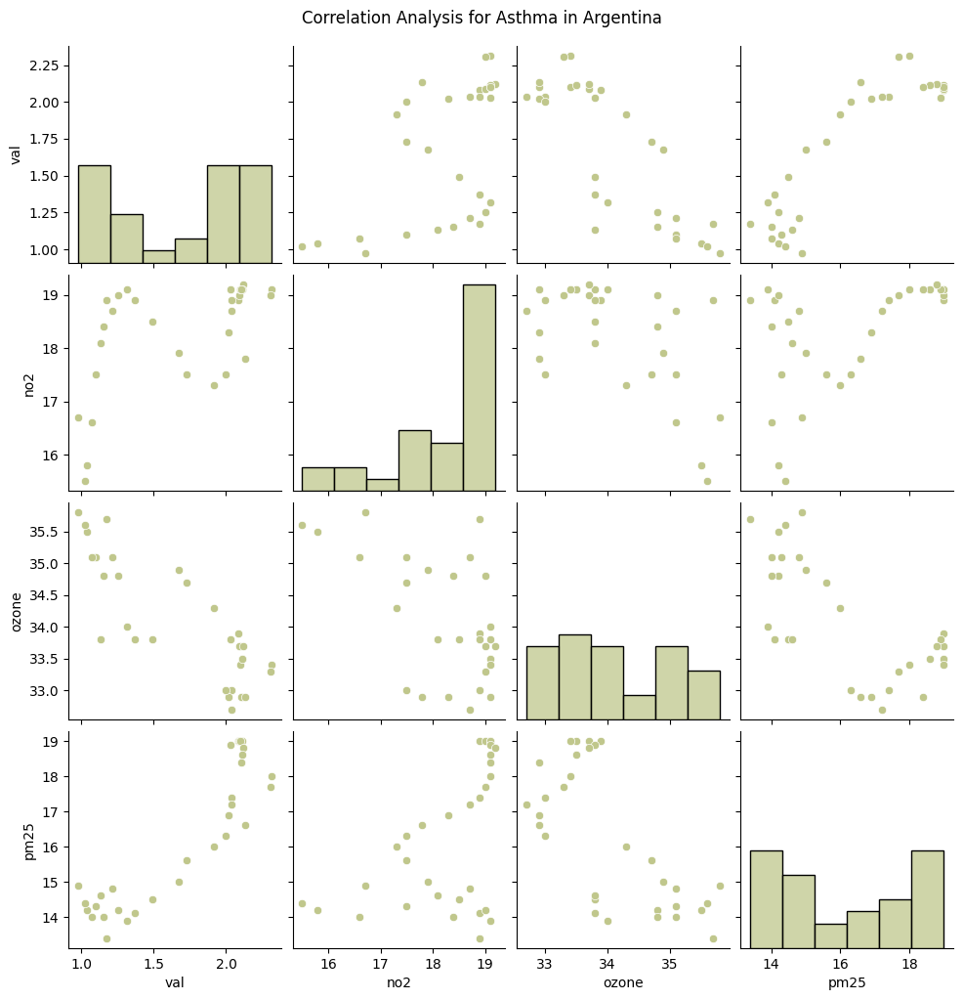

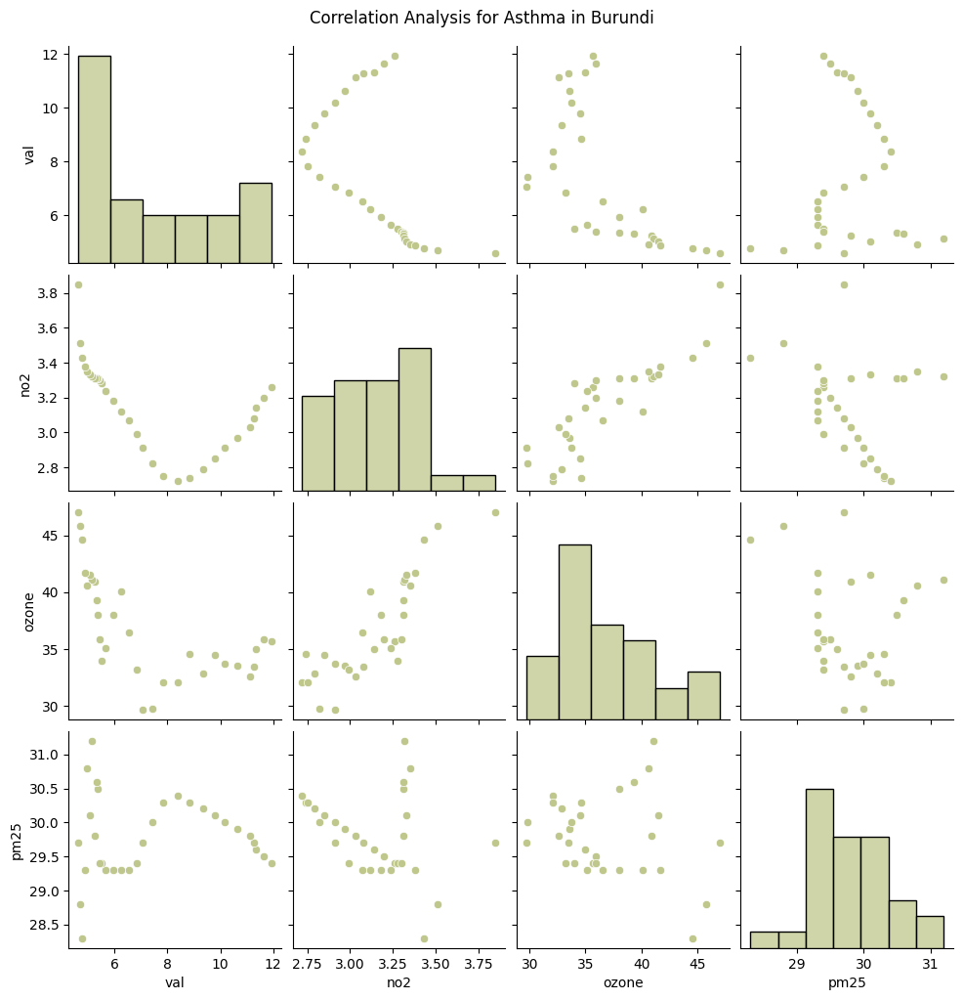

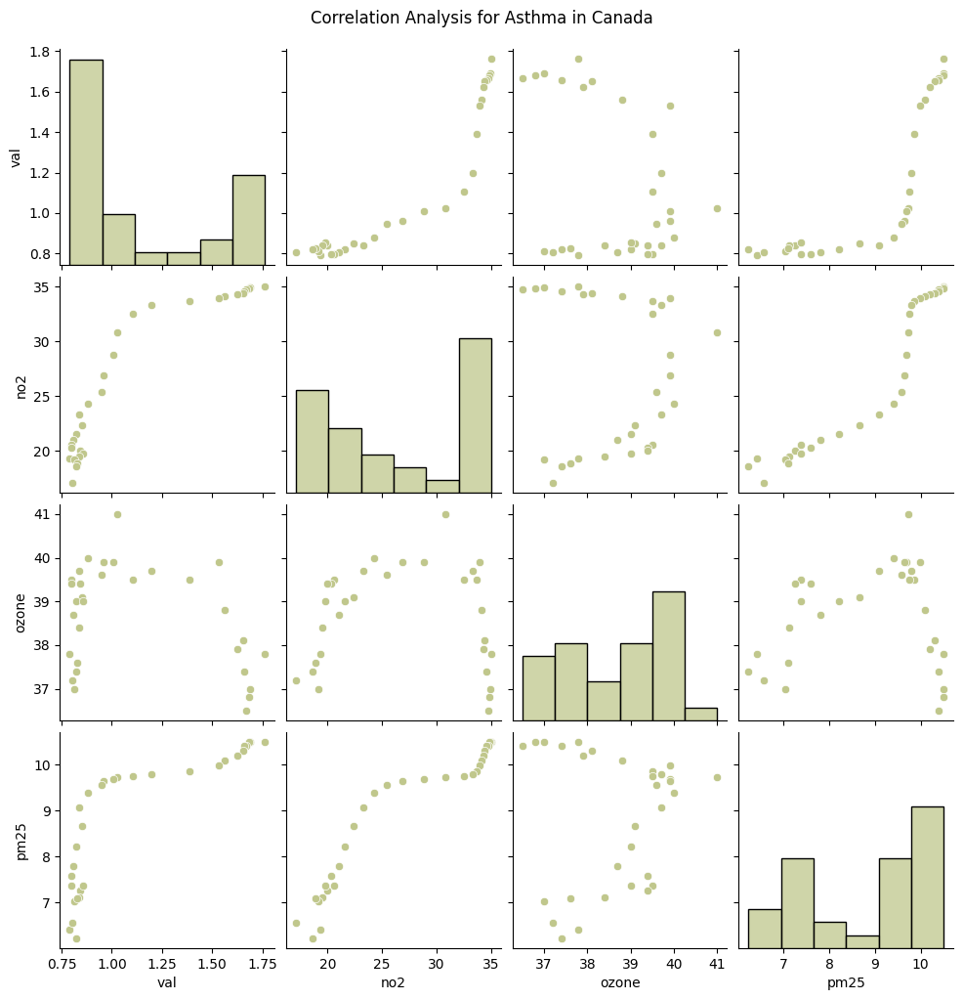

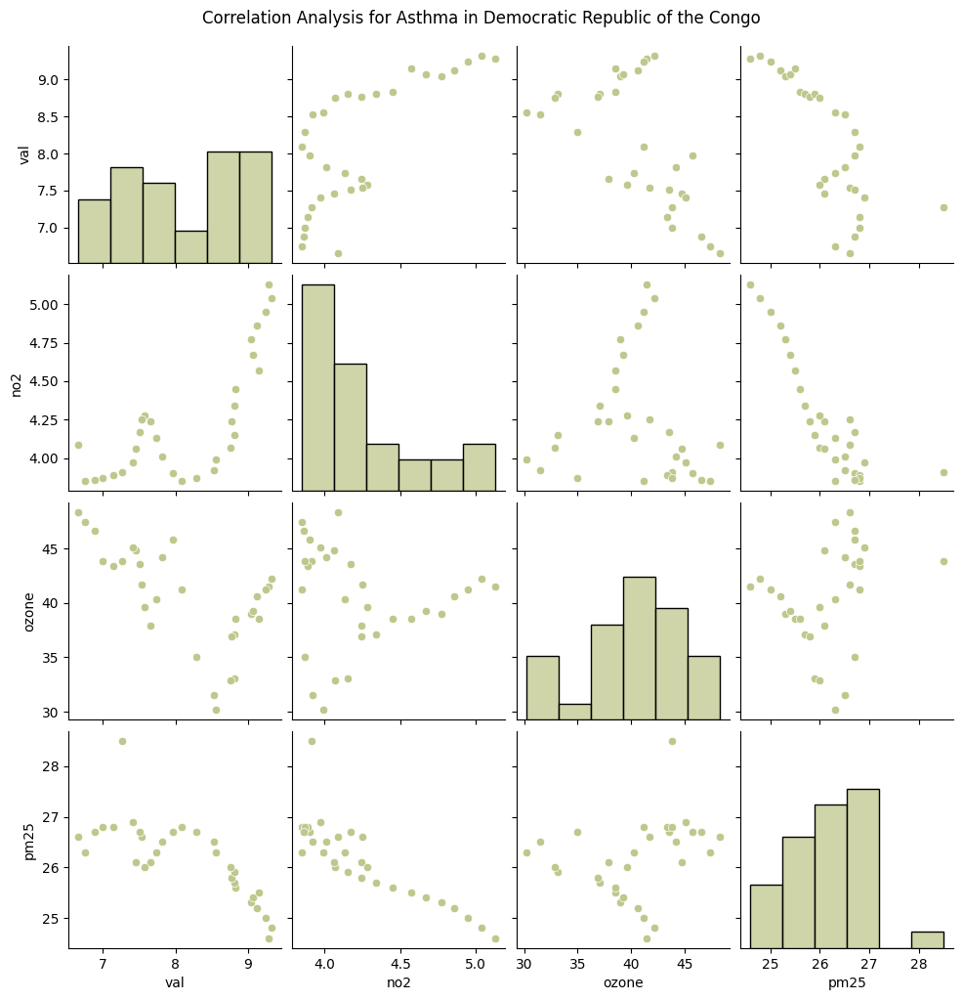

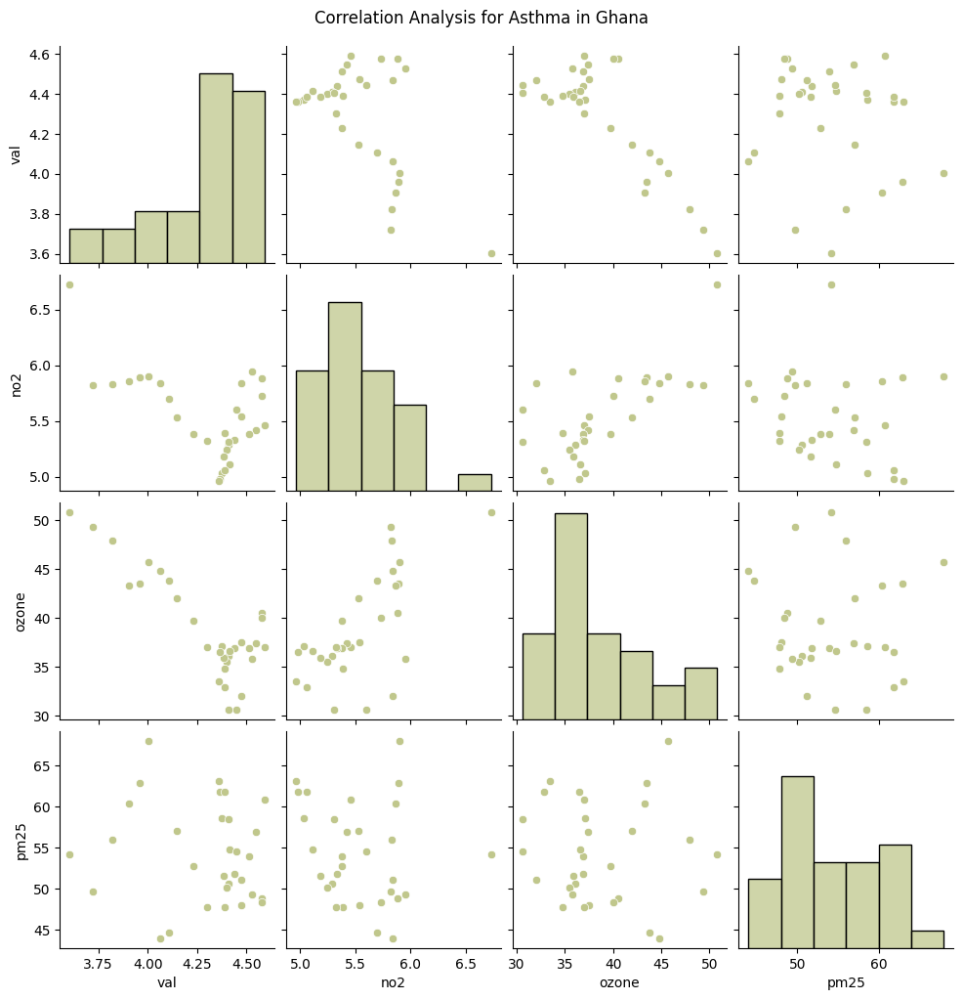

...

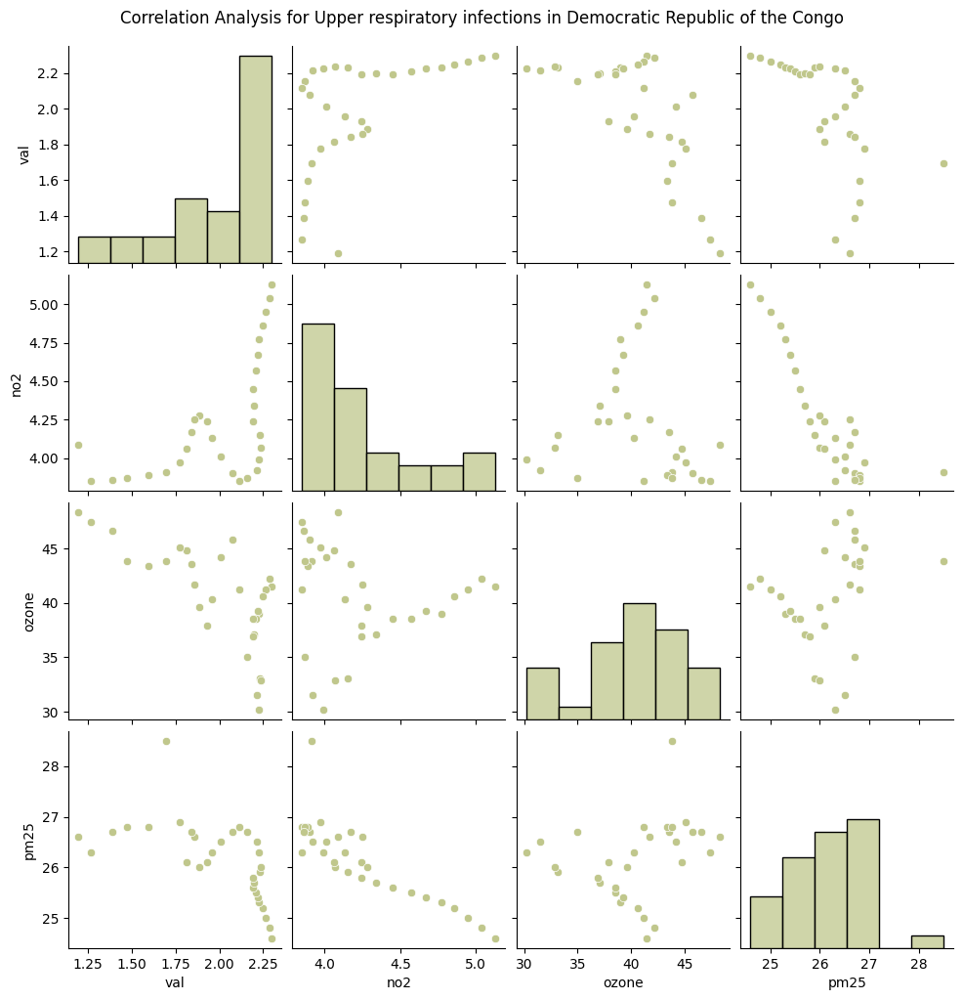

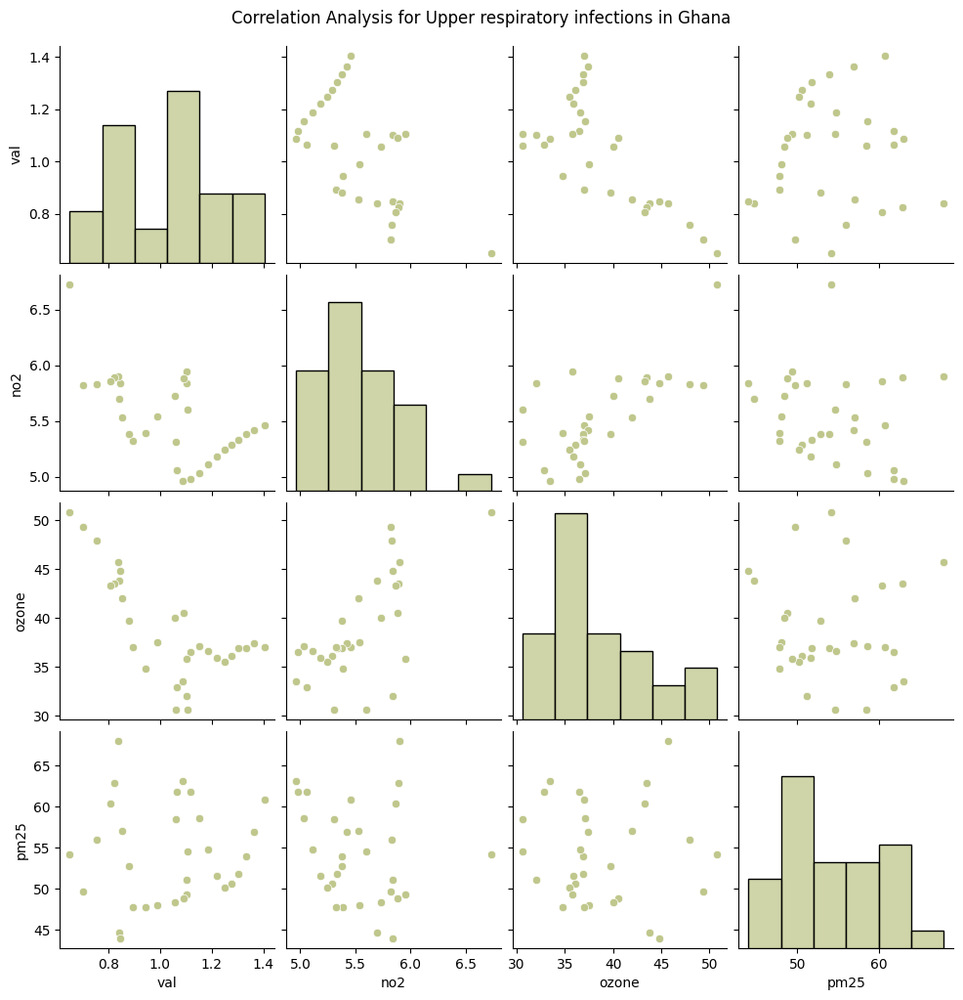

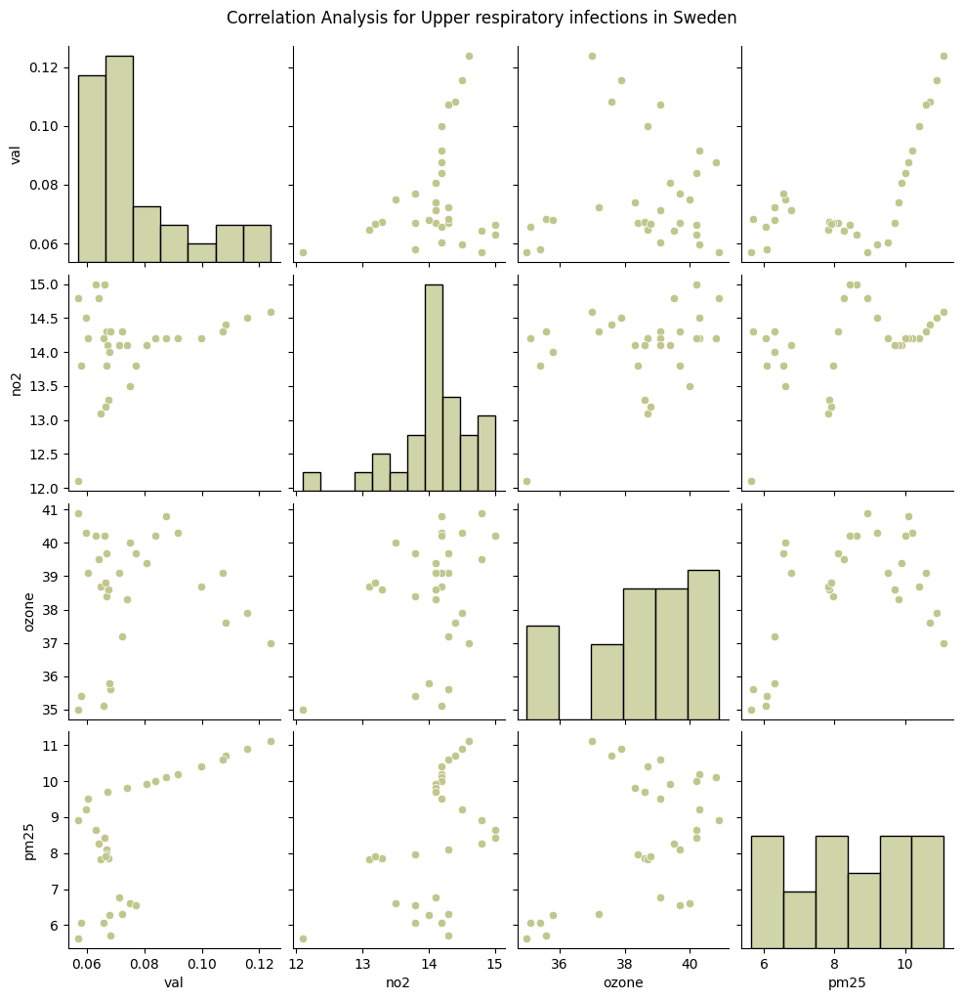

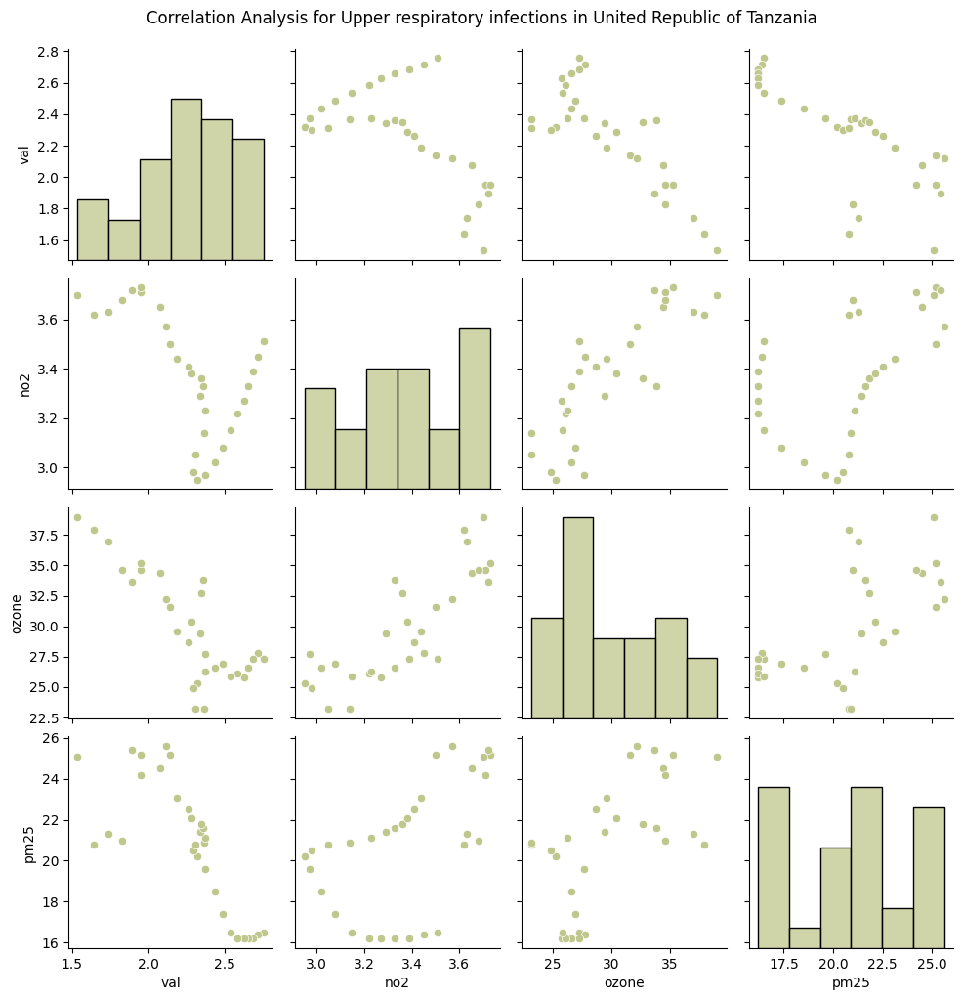

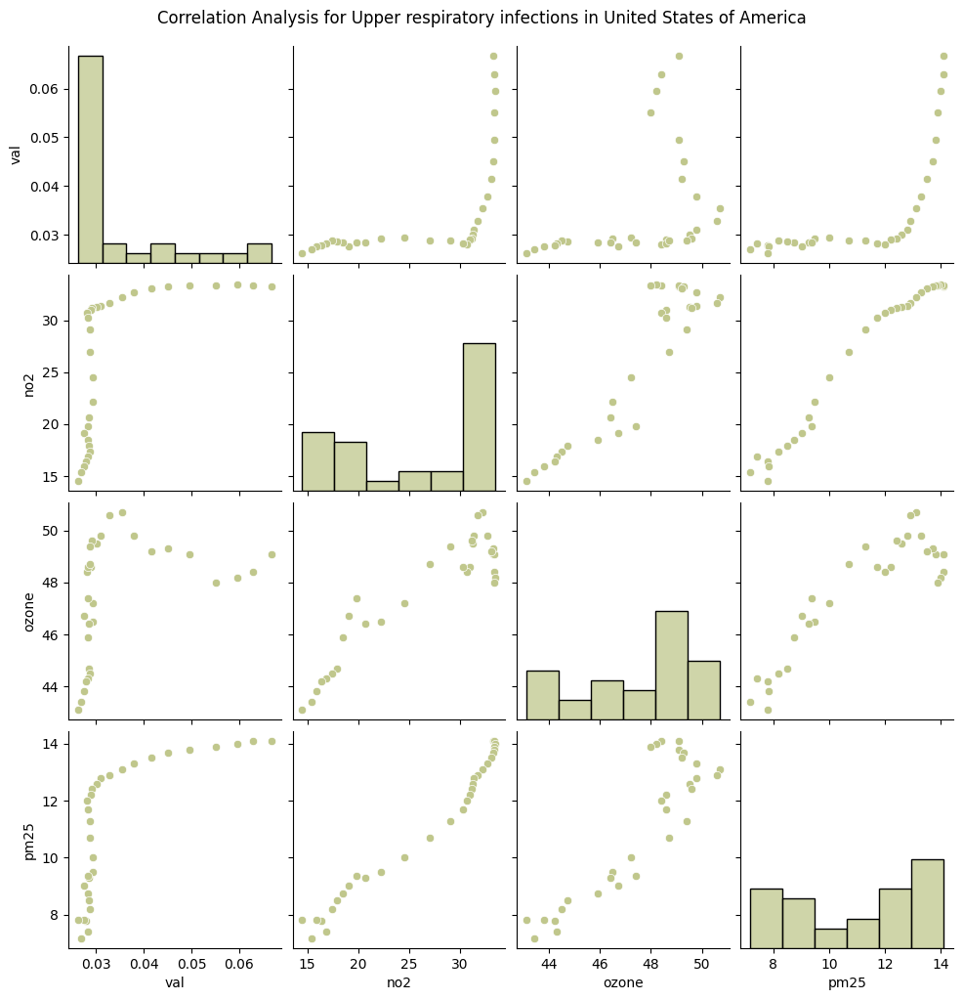

In [89]:
disease_counts = pivoted_data['cause_name'].value_counts()
country_counts = pivoted_data['country'].value_counts()


for d in disease_counts.index:
  for c in country_counts.index:
    disease_data = pivoted_data[(pivoted_data.cause_name == d) & (pivoted_data.country == c)]
    sns.pairplot(disease_data, vars=['val', 'no2', 'ozone', 'pm25'])
    plt.suptitle(f"Correlation Analysis for {d} in {c}", y=1.02)
    plt.show()

In [91]:
strongest_correlation = {}

# Loop through groups by disease
for disease_country, group in pivoted_data.groupby(['country', 'cause_name']):
    # Select only numeric columns for correlation
    numeric_cols = group[['val', 'no2', 'ozone', 'pm25']]
    corr = numeric_cols.corr(method='pearson')

    # Focus on correlations with 'rate_of_death'
    rate_corr = corr.loc['val', ['no2', 'ozone', 'pm25']]

    # Find the pollutant with the highest absolute correlation
    strongest_pollutant = rate_corr.abs().idxmax()
    strongest_value = rate_corr[strongest_pollutant]

    # Store results
    strongest_correlation["-".join(disease_country)] = {
        'pollutant': strongest_pollutant,
        'correlation': strongest_value,
        'correlation_matrix': corr
    }

# Display results
for disease, result in strongest_correlation.items():
    print(f"Disease-Country: {disease}, Strongest Correlation: {result['pollutant']} ({result['correlation']:.2f})")
    # plt.figure(figsize=(8, 5))
    # sns.heatmap(result['correlation_matrix'], annot=True, cmap= ['#ffffff', '#FEFAE0', '#B99470', '#A6B37D', '#C0C78C'], fmt='.3f')
    # plt.show()

Disease-Country: Argentina-Asthma, Strongest Correlation: pm25 (0.89)
Disease-Country: Argentina-Chronic obstructive pulmonary disease, Strongest Correlation: pm25 (-0.78)
Disease-Country: Argentina-Chronic respiratory diseases, Strongest Correlation: pm25 (-0.78)
Disease-Country: Argentina-Interstitial lung disease and pulmonary sarcoidosis, Strongest Correlation: pm25 (-0.97)
Disease-Country: Argentina-Lower respiratory infections, Strongest Correlation: pm25 (-0.92)
Disease-Country: Argentina-Other chronic respiratory diseases, Strongest Correlation: pm25 (0.83)
Disease-Country: Argentina-Pneumoconiosis, Strongest Correlation: ozone (-0.71)
Disease-Country: Argentina-Respiratory infections and tuberculosis, Strongest Correlation: pm25 (-0.74)
Disease-Country: Argentina-Tuberculosis, Strongest Correlation: pm25 (0.95)
Disease-Country: Argentina-Upper respiratory infections, Strongest Correlation: pm25 (0.97)
Disease-Country: Burundi-Asthma, Strongest Correlation: ozone (-0.62)
Diseas